# Tabular Data Exploration

In [ ]:
from google.colab import files
files.upload()

Saving phpMawTba.arff to phpMawTba.arff


{'phpMawTba.arff': b'@relation adult\n\n@attribute age numeric\n@attribute workclass { Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked }\n@attribute fnlwgt numeric\n@attribute education { Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool }\n@attribute education-num numeric\n@attribute marital-status { Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse }\n@attribute occupation { Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces }\n@attribute relationship { Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried }\n@attribute race { White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black }\n@attribute se

In [ ]:
!ls

phpMawTba.arff	sample_data


**Loading adult census dataset**:</br>
We use data from the 1994 US census that we downloaded from
[OpenML](http://openml.org/).

You can look at the OpenML webpage to learn more about this dataset:
<http://www.openml.org/d/1590>

The dataset is available as a CSV (Comma-Separated Values) file and we use
`pandas` to read it.

<div class="admonition note alert alert-info">
<p class="first admonition-title" style="font-weight: bold;">Note</p>
<p class="last"><a class="reference external" href="https://pandas.pydata.org/">Pandas</a> is a Python library used for
manipulating 1 and 2 dimensional structured data. If you have never used
pandas, we recommend you look at this
<a class="reference external"
href="https://pandas.pydata.org/docs/user_guide/10min.html">tutorial</a>.</p>
</div>

In [ ]:
!ls

phpMawTba.arff	sample_data


In [ ]:
!pip install liac-arff

  Preparing metadata (setup.py) ... done
  Created wheel for liac-arff: filename=liac_arff-2.5.0-py3-none-any.whl size=11716 sha256=0d0edd17bf7339b7e30e1838184c275a0e15981a324ba35a6fcd6e9206d8e735
  Stored in directory: /root/.cache/pip/wheels/5d/2a/9c/3895d9617f8f49a0883ba686326d598e78a1c2f54fe3cae86d
Successfully built liac-arff


In [ ]:
import arff
import pandas as pd

fp = open('phpMawTba.arff')
testdata = arff.load(fp)

In [ ]:
colnames = []
for i in range(len(testdata['attributes'])):
  colnames.append(testdata['attributes'][i][0])

adult_census = pd.DataFrame.from_dict(testdata['data'])
adult_census.columns = colnames
adult_census.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,class
0,25.0,Private,226802.0,11th,7.0,Never-married,Machine-op-inspct,Own-child,Black,Male,0.0,0.0,40.0,United-States,<=50K
1,38.0,Private,89814.0,HS-grad,9.0,Married-civ-spouse,Farming-fishing,Husband,White,Male,0.0,0.0,50.0,United-States,<=50K
2,28.0,Local-gov,336951.0,Assoc-acdm,12.0,Married-civ-spouse,Protective-serv,Husband,White,Male,0.0,0.0,40.0,United-States,>50K
3,44.0,Private,160323.0,Some-college,10.0,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688.0,0.0,40.0,United-States,>50K
4,18.0,None,103497.0,Some-college,10.0,Never-married,None,Own-child,White,Female,0.0,0.0,30.0,United-States,<=50K


The goal with this data is to predict whether a person earns over 50K a year
from heterogeneous data such as age, employment, education, family
information, etc.

The column named **class** is our target variable (i.e., the variable which we
want to predict). The two possible classes are `<=50K` (low-revenue) and
`>50K` (high-revenue). The resulting prediction problem is therefore a binary
classification problem as `class` has only two possible values. We use the
left-over columns (any column other than `class`) as input variables for our
model.

In [ ]:
adult_census['class'].value_counts()

<=50K    37155
>50K     11687
Name: class, dtype: int64

Now we can check the number of samples and columns from the dataset

In [ ]:
print(f'The number of samples: {adult_census.shape[0]}\nThe number of columns: {adult_census.shape[1]}')

The number of samples: 48842
The number of columns: 15


So now we can print out the number of featues which is obviously less than 1 from the number of columns of our dataset as class is out target column

In [ ]:
print(f'The number of features: {adult_census.shape[1] - 1}')

The number of features: 14


**Visual Inspection of data:**</br>
Before building a predictive model, it is a good idea to look at the data:

* maybe the task you are trying to achieve can be solved without machine
  learning;
* you need to check that the information you need for your task is actually
  present in the dataset;
* inspecting the data is a good way to find peculiarities. These can arise
  during data collection (for example, malfunctioning sensor or missing
  values), or from the way the data is processed afterwards (for example
  capped values).</br></br>

Let's look at the distribution of individual features, to get some insights
about the data. We can start by plotting histograms, note that this only works
for features containing numerical values:



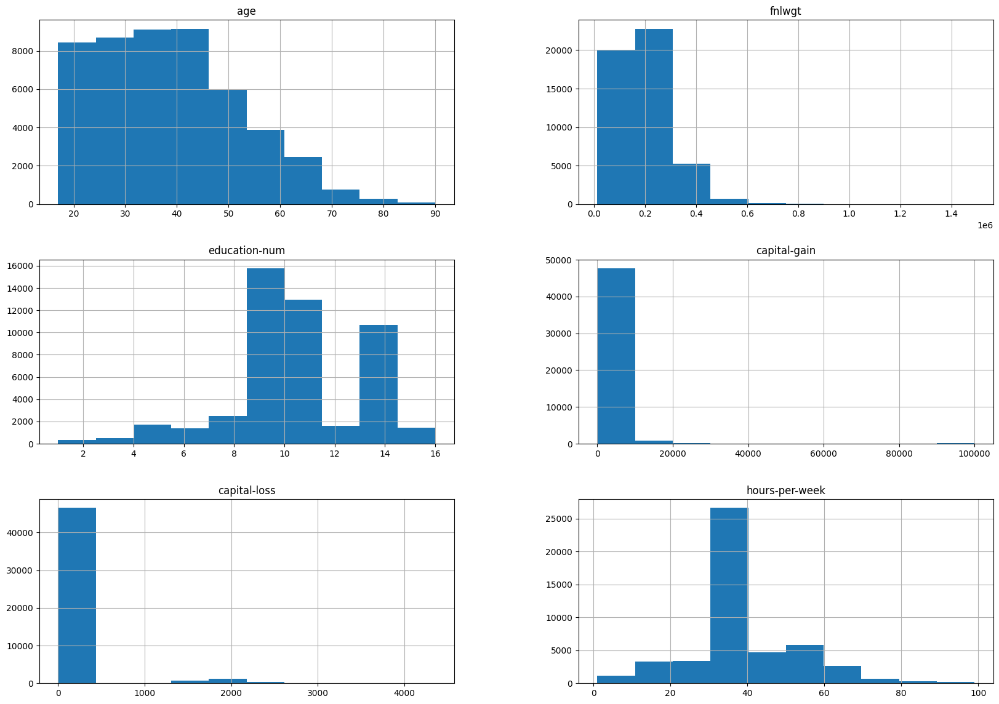

In [ ]:
_ = adult_census.hist(figsize=(20,14))

<div class="admonition tip alert alert-warning">
<p class="first admonition-title" style="font-weight: bold;">Tip</p>
<p class="last">In the previous cell, we used the following pattern: <tt class="docutils literal">_ = func()</tt>. We do this
to avoid showing the output of <tt class="docutils literal">func()</tt> which in this case is not that
useful. We actually assign the output of <tt class="docutils literal">func()</tt> into the variable <tt class="docutils literal">_</tt>
(called underscore). By convention, in Python the underscore variable is used
as a "garbage" variable to store results that we are not interested in.</p>
</div>

We can already make a few comments about some of the variables:

* `"age"`: there are not that many points for `age > 70`. The dataset
  description does indicate that retired people have been filtered out
  (`hours-per-week > 0`);
* `"education-num"`: peak at 10 and 13, hard to tell what it corresponds to
  without looking much further. We'll do that later in this notebook;
* `"hours-per-week"` peaks at 40, this was very likely the standard number of
  working hours at the time of the data collection;
* most values of `"capital-gain"` and `"capital-loss"` are close to zero.

In [ ]:
adult_census["sex"].value_counts()

Male      32650
Female    16192
Name: sex, dtype: int64

Note that the data collection process resulted in an important imbalance
between the number of male/female samples.

Be aware that training a model with such data imbalance can cause
disproportioned prediction errors for the under-represented groups. This is a
typical cause of
[fairness](https://docs.microsoft.com/en-us/azure/machine-learning/concept-fairness-ml#what-is-machine-learning-fairness)
problems if used naively when deploying a machine learning based system in a
real life setting.

In [ ]:
adult_census["education"].value_counts()

HS-grad         15784
Some-college    10878
Bachelors        8025
Masters          2657
Assoc-voc        2061
11th             1812
Assoc-acdm       1601
10th             1389
7th-8th           955
Prof-school       834
9th               756
12th              657
Doctorate         594
5th-6th           509
1st-4th           247
Preschool          83
Name: education, dtype: int64

As noted above, `"education-num"` distribution has two clear peaks around 10
and 13. It would be reasonable to expect that `"education-num"` is the number
of years of education.

Let's look at the relationship between `"education"` and `"education-num"`.

In [ ]:
pd.crosstab(
    index=adult_census['education'],columns=adult_census['education-num']
)

education-num,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0
education,,,,,,,,,,,,,,,,
10th,0,0,0,0,0,1389,0,0,0,0,0,0,0,0,0,0
11th,0,0,0,0,0,0,1812,0,0,0,0,0,0,0,0,0
12th,0,0,0,0,0,0,0,657,0,0,0,0,0,0,0,0
1st-4th,0,247,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5th-6th,0,0,509,0,0,0,0,0,0,0,0,0,0,0,0,0
7th-8th,0,0,0,955,0,0,0,0,0,0,0,0,0,0,0,0
9th,0,0,0,0,756,0,0,0,0,0,0,0,0,0,0,0
Assoc-acdm,0,0,0,0,0,0,0,0,0,0,0,1601,0,0,0,0
Assoc-voc,0,0,0,0,0,0,0,0,0,0,2061,0,0,0,0,0


For every entry in `\"education\"`, there is only one single corresponding
value in `\"education-num\"`. This shows that `"education"` and
`"education-num"` give you the same information. For example,
`"education-num"=2` is equivalent to `"education"="1st-4th"`. In practice that
means we can remove `"education-num"` without losing information. Note that
having redundant (or highly correlated) columns can be a problem for machine
learning algorithms.

Another way to inspect the data is to do a `pairplot` and show how each
variable differs according to our target, i.e. `"class"`. Plots along the
diagonal show the distribution of individual variables for each `"class"`. The
plots on the off-diagonal can reveal interesting interactions between
variables.

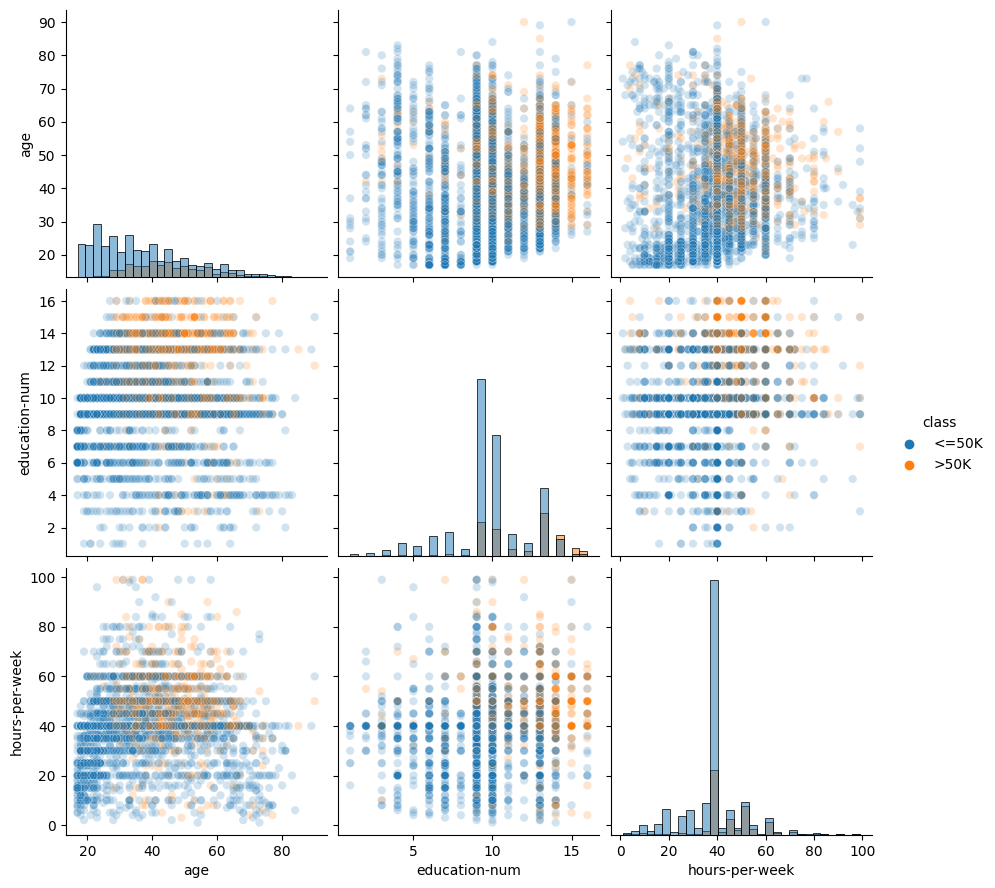

In [ ]:
import seaborn as sns
n_samples_to_plot = 5000
columns = ["age", "education-num", "hours-per-week"]
_=sns.pairplot(
    data=adult_census[:n_samples_to_plot],
    vars=columns,
    hue='class',
    plot_kws={"alpha": 0.2},
    height=3,
    diag_kind="hist",
    diag_kws={"bins": 30},
)


By looking at the previous plots, we could create some hand-written rules that
predict whether someone has a high- or low-income. For instance, we could
focus on the combination of the `"hours-per-week"` and `"age"` features.

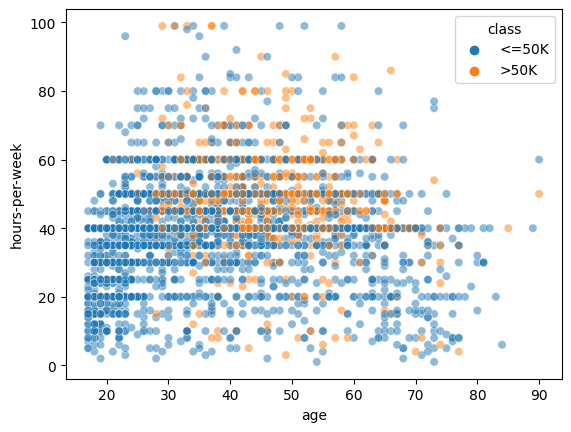

In [ ]:
_ = sns.scatterplot(
    x="age",
    y="hours-per-week",
    data=adult_census[:n_samples_to_plot],
    hue='class',
    alpha=0.5,
)

In this plot, we can try to find regions that mainly contains a single class
such that we can easily decide what class one should predict. We could come up
with hand-written rules as shown in this plot:

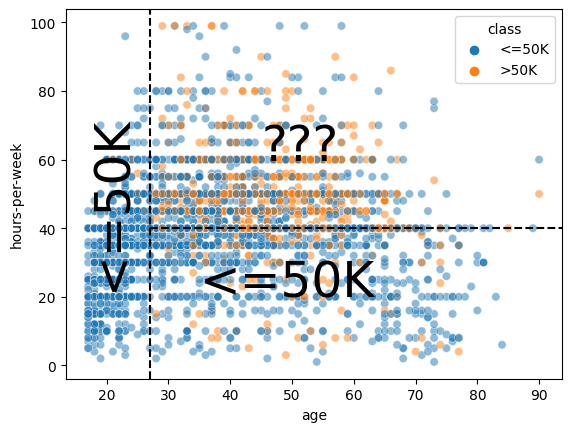

In [ ]:
import matplotlib.pyplot as plt

ax = sns.scatterplot(
    x="age",
    y="hours-per-week",
    data=adult_census[:n_samples_to_plot],
    hue='class',
    alpha=0.5,
)

age_limit = 27
plt.axvline(x=age_limit, ymin=0, ymax=1, color="black", linestyle="--")

hours_per_week_limit = 40
plt.axhline(
    y=hours_per_week_limit, xmin=0.17, xmax=1, color="black", linestyle="--"
)

plt.annotate("<=50K", (17, 25), rotation=90, fontsize=35)
plt.annotate("<=50K", (35, 20), fontsize=35)
_ = plt.annotate("???", (45, 60), fontsize=35)

* In the region `age < 27` (left region) the prediction is low-income. Indeed,
  there are many blue points and we cannot see any orange points.
* In the region `age > 27 AND hours-per-week < 40` (bottom-right region), the
  prediction is low-income. Indeed, there are many blue points and only a few
  orange points.
* In the region `age > 27 AND hours-per-week > 40` (top-right region), we see
  a mix of blue points and orange points. It seems complicated to choose which
  class we should predict in this region.

It is interesting to note that some machine learning models work similarly to
what we did: they are known as decision tree models. The two thresholds that
we chose (27 years and 40 hours) are somewhat arbitrary, i.e. we chose them by
only looking at the pairplot. In contrast, a decision tree chooses the "best"
splits based on data without human intervention or inspection. Decision trees
will be covered more in detail in a future module.

Note that machine learning is often used when creating rules by hand is not
straightforward. For example because we are in high dimension (many features
in a table) or because there are no simple and obvious rules that separate the
two classes as in the top-right region of the previous plot.

To sum up, the important thing to remember is that in a machine-learning
setting, a model automatically creates the "rules" from the existing data in
order to make predictions on new unseen data.

# First Model with SKlearn

* the scikit-learn API: `.fit(X, y)`/`.predict(X)`/`.score(X, y)`;
* how to evaluate the generalization performance of a model with a train-test
  split.

Here API stands for "Application Programming Interface" and refers to a set of
conventions to build self-consistent software

In [ ]:
from google.colab import files
files.upload()

Saving adult-census-numeric.csv to adult-census-numeric.csv


{'adult-census-numeric.csv': b'age,capital-gain,capital-loss,hours-per-week,class\n41,0,0,92, <=50K\n48,0,0,40, <=50K\n60,0,0,25, <=50K\n37,0,0,45, <=50K\n73,3273,0,40, <=50K\n57,0,0,72, <=50K\n22,0,0,35, <=50K\n55,27828,0,55, >50K\n45,0,0,40, <=50K\n36,0,0,50, >50K\n42,0,1902,50, >50K\n67,0,0,41, <=50K\n25,0,0,20, <=50K\n23,0,0,40, <=50K\n38,15024,0,40, >50K\n21,0,0,40, <=50K\n43,15024,0,45, >50K\n21,0,0,20, <=50K\n46,0,0,40, <=50K\n47,0,0,40, <=50K\n27,0,0,40, <=50K\n90,1086,0,60, <=50K\n48,3325,0,53, <=50K\n75,4931,0,3, <=50K\n24,0,0,40, >50K\n50,0,0,40, >50K\n27,0,0,40, <=50K\n52,0,0,25, <=50K\n27,0,0,60, <=50K\n29,0,0,60, >50K\n19,0,0,40, <=50K\n28,0,0,40, <=50K\n46,0,0,50, >50K\n39,0,0,40, <=50K\n50,0,0,40, <=50K\n40,0,0,42, >50K\n67,0,0,20, <=50K\n44,0,0,65, >50K\n41,0,0,40, <=50K\n28,0,0,24, <=50K\n27,0,0,50, <=50K\n60,0,0,40, <=50K\n49,0,0,40, >50K\n35,0,0,35, <=50K\n39,0,0,40, >50K\n20,0,0,20, <=50K\n22,0,0,40, <=50K\n24,0,0,40, <=50K\n30,7688,0,50, >50K\n52,5013,0,40, <=50K\

In [ ]:
adult_census=pd.read_csv('adult-census-numeric.csv')

In [ ]:
adult_census.head()

,age,capital-gain,capital-loss,hours-per-week,class
0,41,0,0,92,<=50K
1,48,0,0,40,<=50K
2,60,0,0,25,<=50K
3,37,0,0,45,<=50K
4,73,3273,0,40,<=50K


**Separate the data and target**

In [ ]:
target=adult_census['class']
target

0         <=50K
1         <=50K
2         <=50K
3         <=50K
4         <=50K
          ...  
39068     <=50K
39069     <=50K
39070      >50K
39071     <=50K
39072      >50K
Name: class, Length: 39073, dtype: object

In [ ]:
data=adult_census.drop(columns='class')
data.head()

,age,capital-gain,capital-loss,hours-per-week
0,41,0,0,92
1,48,0,0,40
2,60,0,0,25
3,37,0,0,45
4,73,3273,0,40


In [ ]:
data=data.loc[:,['age','capital-gain','capital-loss','hours-per-week']]

**Fit a model and make predictions**

We now build a classification model using the "K-nearest neighbors" strategy.
To predict the target of a new sample, a k-nearest neighbors takes into
account its `k` closest samples in the training set and predicts the majority
target of these samples.

<div class="admonition caution alert alert-warning">
<p class="first admonition-title" style="font-weight: bold;">Caution!</p>
<p class="last">We use a K-nearest neighbors here. However, be aware that it is seldom useful
in practice. We use it because it is an intuitive algorithm. In the next
notebook, we will introduce better models.</p>
</div>

The `fit` method is called to train the model from the input (features) and
target data.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier() #default k=5
_=model.fit(data, target)

n_neighbors int, default=5
Number of neighbors to use by default for kneighbors queries.

In [ ]:
target_predicted = model.predict(data)

In [ ]:
target_predicted[:5]

array([' >50K', ' <=50K', ' <=50K', ' <=50K', ' <=50K'], dtype=object)

In [ ]:
target[:5]

0     <=50K
1     <=50K
2     <=50K
3     <=50K
4     <=50K
Name: class, dtype: object

In [ ]:
target[:5] == target_predicted[:5]

0    False
1     True
2     True
3     True
4     True
Name: class, dtype: bool

In [ ]:
print(
    "Number of correct prediction: "
    f"{(target[:5] == target_predicted[:5]).sum()} / 5"
)

Number of correct prediction: 4 / 5


In [ ]:
(target == target_predicted).mean() #avg success rate

0.8242776341719346

This result means that the model makes a correct prediction for approximately
82 samples out of 100. Note that we used the same data to train and evaluate
our model.

When building a machine learning model, it is important to evaluate the
trained model on data that was not used to fit it, as **generalization** is
more than memorization (meaning we want a rule that generalizes to new data,
without comparing to data we memorized). It is harder to conclude on
never-seen instances than on already seen ones.

Correct evaluation is easily done by leaving out a subset of the data when
training the model and using it afterwards for model evaluation. The data used
to fit a model is called training data while the data used to assess a model
is called testing data.

We can load more data, which was actually left-out from the original data set.

In [ ]:
from google.colab import files
files.upload()

Saving adult-census-numeric-test.csv to adult-census-numeric-test.csv


{'adult-census-numeric-test.csv': b'age,capital-gain,capital-loss,hours-per-week,class\n41,0,0,92, <=50K\n48,0,0,40, <=50K\n60,0,0,25, <=50K\n37,0,0,45, <=50K\n73,3273,0,40, <=50K\n57,0,0,72, <=50K\n22,0,0,35, <=50K\n55,27828,0,55, >50K\n45,0,0,40, <=50K\n36,0,0,50, >50K\n42,0,1902,50, >50K\n67,0,0,41, <=50K\n25,0,0,20, <=50K\n23,0,0,40, <=50K\n38,15024,0,40, >50K\n21,0,0,40, <=50K\n43,15024,0,45, >50K\n21,0,0,20, <=50K\n46,0,0,40, <=50K\n47,0,0,40, <=50K\n27,0,0,40, <=50K\n90,1086,0,60, <=50K\n48,3325,0,53, <=50K\n75,4931,0,3, <=50K\n24,0,0,40, >50K\n50,0,0,40, >50K\n27,0,0,40, <=50K\n52,0,0,25, <=50K\n27,0,0,60, <=50K\n29,0,0,60, >50K\n19,0,0,40, <=50K\n28,0,0,40, <=50K\n46,0,0,50, >50K\n39,0,0,40, <=50K\n50,0,0,40, <=50K\n40,0,0,42, >50K\n67,0,0,20, <=50K\n44,0,0,65, >50K\n41,0,0,40, <=50K\n28,0,0,24, <=50K\n27,0,0,50, <=50K\n60,0,0,40, <=50K\n49,0,0,40, >50K\n35,0,0,35, <=50K\n39,0,0,40, >50K\n20,0,0,20, <=50K\n22,0,0,40, <=50K\n24,0,0,40, <=50K\n30,7688,0,50, >50K\n52,5013,0,40, <

In [ ]:
!ls

adult-census-numeric.csv  adult-census-numeric-test.csv  phpMawTba.arff  sample_data


In [ ]:
adult_census_test=pd.read_csv('adult-census-numeric-test.csv')

In [ ]:
target_test = adult_census_test['class']
data_test = adult_census_test.drop(columns=['class'])
data_test.head()

,age,capital-gain,capital-loss,hours-per-week
0,41,0,0,92
1,48,0,0,40
2,60,0,0,25
3,37,0,0,45
4,73,3273,0,40


In [ ]:
# checking the number of features
print(
    f"The testing dataset contains {data_test.shape[0]} samples and "
    f"{data_test.shape[1]} features"
)

The testing dataset contains 39073 samples and 4 features


Instead of computing the prediction and manually computing the average success
rate, we can use the method `score`. When dealing with classifiers this method
returns their performance metric.

In [ ]:
accuracy = model.score(data_test, target_test)
model_name = model.__class__.__name__

print(f"The test accuracy using a {model_name} is {accuracy:.3f}")

The test accuracy using a KNeighborsClassifier is 0.824


If we want to ever download our csv file into local computer


In [ ]:
adult_census_test.to_csv('my-local-file.csv',index=False)
from IPython.display import FileLink
FileLink('my-local-file.csv')

/content/my-local-file.csv

# Working with numerical data

In this section, we aim at:

* identifying numerical data in a heterogeneous dataset;
* selecting the subset of columns corresponding to numerical data;
* using a scikit-learn helper to separate data into train-test sets;
* training and evaluating a more complex scikit-learn model.

We start by loading the adult census dataset used during the data exploration.


In [ ]:
from google.colab import files
files.upload()

Saving adult-census.csv to adult-census.csv


{'adult-census.csv': b'age,workclass,education,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,class\n25, Private, 11th, Never-married, Machine-op-inspct, Own-child, Black, Male,0,0,40, United-States, <=50K\n38, Private, HS-grad, Married-civ-spouse, Farming-fishing, Husband, White, Male,0,0,50, United-States, <=50K\n28, Local-gov, Assoc-acdm, Married-civ-spouse, Protective-serv, Husband, White, Male,0,0,40, United-States, >50K\n44, Private, Some-college, Married-civ-spouse, Machine-op-inspct, Husband, Black, Male,7688,0,40, United-States, >50K\n18, ?, Some-college, Never-married, ?, Own-child, White, Female,0,0,30, United-States, <=50K\n34, Private, 10th, Never-married, Other-service, Not-in-family, White, Male,0,0,30, United-States, <=50K\n29, ?, HS-grad, Never-married, ?, Unmarried, Black, Male,0,0,40, United-States, <=50K\n63, Self-emp-not-inc, Prof-school, Married-civ-spouse, Prof-specialty, Husband, White, Male,3103,0,32, Uni

In [ ]:
adult_census=pd.read_csv('adult-census.csv')
adult_census.head()

,age,workclass,education,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,class
0,25,Private,11th,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,HS-grad,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,Assoc-acdm,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,Some-college,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,?,Some-college,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K


now we will separate data and target

In [ ]:
data,target=adult_census.drop(columns='class'),adult_census['class']

`**Note**`

Here and later, we use the name data and target to be explicit. In scikit-learn documentation, data is commonly named X and target is commonly called y.

At this point, we can focus on the data we want to use to train our predictive
model.

**Identify numerical data**

Numerical data are represented with numbers. They are linked to measurable
(quantitative) data, such as age or the number of hours a person works a week.

Predictive models are natively designed to work with numerical data. Moreover,
numerical data usually requires very little work before getting started with
training.

The first task here is to identify numerical data in our dataset.

<div class="admonition caution alert alert-warning">
<p class="first admonition-title" style="font-weight: bold;">Caution!</p>
<p class="last">Numerical data are represented with numbers, but numbers do not always
represent numerical data. Categories could already be encoded with
numbers and you may need to identify these features.</p>
</div>

Thus, we can check the data type for each of the column in the dataset.

In [ ]:
data.dtypes.unique()

array([dtype('int64'), dtype('O')], dtype=object)

In [ ]:
data.head()

,age,workclass,education,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country
0,25,Private,11th,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States
1,38,Private,HS-grad,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States
2,28,Local-gov,Assoc-acdm,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States
3,44,Private,Some-college,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States
4,18,?,Some-college,Never-married,?,Own-child,White,Female,0,0,30,United-States


In [ ]:
numerical_cols=['age','capital-gain','capital-loss','hours-per-week']
data[numerical_cols].head()

,age,capital-gain,capital-loss,hours-per-week
0,25,0,0,40
1,38,0,0,50
2,28,0,0,40
3,44,7688,0,40
4,18,0,0,30


In [ ]:
data.age.describe()

count    48842.000000
mean        38.643585
std         13.710510
min         17.000000
25%         28.000000
50%         37.000000
75%         48.000000
max         90.000000
Name: age, dtype: float64

In [ ]:
data_numeric=data[numerical_cols]

**Train Test Split the dataset**

In the previous section, we loaded two separate datasets: a training one and
a testing one. However, having separate datasets in two distincts files is
unusual: most of the time, we have a single file containing all the data that
we need to split once loaded in the memory.

Scikit-learn provides the helper function
`sklearn.model_selection.train_test_split` which is used to automatically
split the dataset into two subsets.

In [ ]:
from sklearn.model_selection import train_test_split
data_train,data_test,target_train,target_test = train_test_split(
    data_numeric,target,random_state=42,test_size=0.25
)

Tip

In scikit-learn setting the random_state parameter allows to get deterministic results when we use a random number generator. In the train_test_split case the randomness comes from shuffling the data, which decides how the dataset is split into a train and a test set).

When calling the function train_test_split, we specified that we would like to have 25% of samples in the testing set while the remaining samples (75%) are assigned to the training set. We can check quickly if we got what we expected.

In [ ]:
print(
    f"Number of samples in testing: {data_test.shape[0]} => "
    f"{data_test.shape[0] / data_numeric.shape[0] * 100:.1f}% of the"
    " original set"
)

Number of samples in testing: 12211 => 25.0% of the original set


In [ ]:
print(
    f"Number of samples in training: {data_train.shape[0]} => "
    f"{data_train.shape[0] / data_numeric.shape[0] * 100:.1f}% of the"
    " original set"
)

Number of samples in training: 36631 => 75.0% of the original set


In the previous notebook, we used a k-nearest neighbors model. While this model is intuitive to understand, it is not widely used in practice. Now, we use a more useful model, called a logistic regression, which belongs to the linear models family.

Note

In short, linear models find a set of weights to combine features linearly and predict the target. For instance, the model can come up with a rule such as:

if 0.1 * age + 3.3 * hours-per-week - 15.1 > 0, predict high-income
otherwise predict low-income

In [ ]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()

In [ ]:
_=model.fit(data_train,target_train)

In [ ]:
accuracy=model.score(data_test,target_test)
print(f'Accuracy in Logistic Regression is : {accuracy}')


Accuracy in Logistic Regression is : 0.8070592089099992


**Exercise:** Use DummyClassifier

In [ ]:
from sklearn.dummy import DummyClassifier
model=DummyClassifier()
_=model.fit(data_train,target_train)

In [ ]:
accuracy=model.score(data_test,target_test)
print(accuracy)

0.7660306281221849


# Preprocessing for Numerical Features

Here we introduce these new aspects:

* an example of preprocessing, namely **scaling numerical variables**;
* using a scikit-learn **pipeline** to chain preprocessing and model training.


In [ ]:
adult_census=pd.read_csv('adult-census.csv')

In [ ]:
target_name = "class"
target = adult_census[target_name]
data = adult_census.drop(columns=target_name)

In [ ]:
numerical_columns = ["age", "capital-gain", "capital-loss", "hours-per-week"]

data_numeric = data[numerical_columns]

In [ ]:
from sklearn.model_selection import train_test_split

data_train, data_test, target_train, target_test = train_test_split(
    data_numeric, target, random_state=42
)

**Model fitting with preprocessing**

A range of preprocessing algorithms in scikit-learn allow us to transform the
input data before training a model. In our case, we will standardize the data
and then train a new logistic regression model on that new version of the
dataset.

Let's start by printing some statistics about the training data.

In [ ]:
data_train.describe()

,age,capital-gain,capital-loss,hours-per-week
count,36631.000000,36631.000000,36631.000000,36631.000000
mean,38.642352,1087.077721,89.665311,40.431247
std,13.725748,7522.692939,407.110175,12.423952
min,17.000000,0.000000,0.000000,1.000000
25%,28.000000,0.000000,0.000000,40.000000
50%,37.000000,0.000000,0.000000,40.000000
75%,48.000000,0.000000,0.000000,45.000000
max,90.000000,99999.000000,4356.000000,99.000000


We see that the dataset's features span across different ranges. Some
algorithms make some assumptions regarding the feature distributions and
normalizing features is usually helpful to address such assumptions.

`Tip`
<p>Here are some reasons for scaling features:</p>
<ul class="last simple">
<li>Models that rely on the distance between a pair of samples, for instance
k-nearest neighbors, should be trained on normalized features to make each
feature contribute approximately equally to the distance computations.</li>
<li>Many models such as logistic regression use a numerical solver (based on
gradient descent) to find their optimal parameters. This solver converges
faster when the features are scaled.</li>
</ul>
</div>

Whether or not a machine learning model requires scaling the features depends
on the model family. Linear models such as logistic regression generally
benefit from scaling the features while other models such as decision trees do
not need such preprocessing (but would not suffer from it).

We show how to apply such normalization using a scikit-learn transformer
called `StandardScaler`. This transformer shifts and scales each feature
individually so that they all have a 0-mean and a unit standard deviation.

We now investigate different steps used in scikit-learn to achieve such a
transformation of the data.

First, one needs to call the method `fit` in order to learn the scaling from
the data.

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaler.fit(data_train)

StandardScaler()

The `fit` method for transformers is similar to the `fit` method for
predictors. The main difference is that the former has a single argument (the
data matrix), whereas the latter has two arguments (the data matrix and the
target).

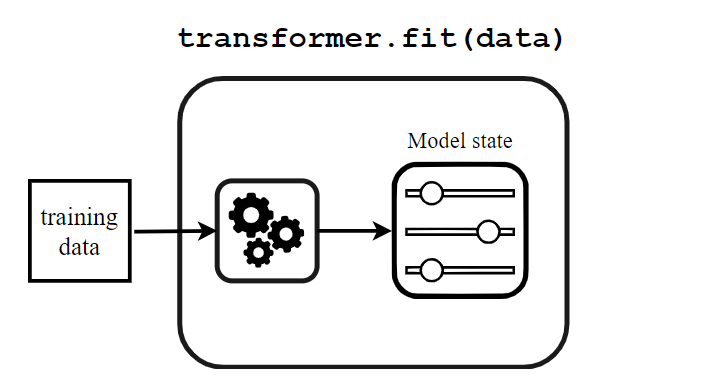

In this case, the algorithm needs to compute the mean and standard deviation
for each feature and store them into some NumPy arrays. Here, these statistics
are the model states.

<div class="admonition note alert alert-info">
<p class="first admonition-title" style="font-weight: bold;">Note</p>
<p class="last">The fact that the model states of this scaler are arrays of means and standard
deviations is specific to the <tt class="docutils literal">StandardScaler</tt>. Other scikit-learn
transformers may compute different statistics and store them as model states,
in a similar fashion.</p>
</div>

We can inspect the computed means and standard deviations.

In [ ]:
scaler.mean_

array([  38.64235211, 1087.07772106,   89.6653108 ,   40.43124676])

In [ ]:
scaler.scale_

array([  13.72556083, 7522.59025606,  407.10461772,   12.42378265])

<div class="admonition note alert alert-info">
<p class="first admonition-title" style="font-weight: bold;">Note</p>
<p class="last">scikit-learn convention: if an attribute is learned from the data, its name
ends with an underscore (i.e. <tt class="docutils literal">_</tt>), as in <tt class="docutils literal">mean_</tt> and <tt class="docutils literal">scale_</tt> for the
<tt class="docutils literal">StandardScaler</tt>.</p>
</div>

Scaling the data is applied to each feature individually (i.e. each column in
the data matrix). For each feature, we subtract its mean and divide by its
standard deviation.

Once we have called the `fit` method, we can perform data transformation by
calling the method `transform`.

In [ ]:
data_train_scaled = scaler.transform(data_train)
data_train_scaled

array([[ 0.17177061, -0.14450843,  5.71188483, -2.28845333],
       [ 0.02605707, -0.14450843, -0.22025127, -0.27618374],
       [-0.33822677, -0.14450843, -0.22025127,  0.77019645],
       ...,
       [-0.77536738, -0.14450843, -0.22025127, -0.03471139],
       [ 0.53605445, -0.14450843, -0.22025127, -0.03471139],
       [ 1.48319243, -0.14450843, -0.22025127, -2.69090725]])

The `transform` method for transformers is similar to the `predict` method for
predictors. It uses a predefined function, called a **transformation
function**, and uses the model states and the input data. However, instead of
outputting predictions, the job of the `transform` method is to output a
transformed version of the input data.

In [ ]:
data_train_scaled = scaler.fit_transform(data_train)
data_train_scaled

array([[ 0.17177061, -0.14450843,  5.71188483, -2.28845333],
       [ 0.02605707, -0.14450843, -0.22025127, -0.27618374],
       [-0.33822677, -0.14450843, -0.22025127,  0.77019645],
       ...,
       [-0.77536738, -0.14450843, -0.22025127, -0.03471139],
       [ 0.53605445, -0.14450843, -0.22025127, -0.03471139],
       [ 1.48319243, -0.14450843, -0.22025127, -2.69090725]])

Finally, the method `fit_transform` is a shorthand method to call successively
`fit` and then `transform`.

In scikit-learn jargon, a **transformer** is defined as an estimator (an
object with a `fit` method) supporting `transform` or `fit_transform`.

By default, all scikit-learn transformers output NumPy arrays. Since
scikit-learn 1.2, it is possible to set the output to be a pandas dataframe,
which makes data exploration easier as it preserves the column names. The
method `set_output` controls this behaviour. Please refer to this [example
from the scikit-learn
documentation](https://scikit-learn.org/stable/auto_examples/miscellaneous/plot_set_output.html)
for more options to configure the output of transformers.

In [ ]:
scaler = StandardScaler().set_output(transform="pandas")
data_train_scaled = scaler.fit_transform(data_train)
data_train_scaled.describe()

,age,capital-gain,capital-loss,hours-per-week
count,3.663100e+04,3.663100e+04,3.663100e+04,3.663100e+04
mean,-2.273364e-16,3.530310e-17,3.840667e-17,1.844684e-16
std,1.000014e+00,1.000014e+00,1.000014e+00,1.000014e+00
min,-1.576792e+00,-1.445084e-01,-2.202513e-01,-3.173852e+00
25%,-7.753674e-01,-1.445084e-01,-2.202513e-01,-3.471139e-02
50%,-1.196565e-01,-1.445084e-01,-2.202513e-01,-3.471139e-02
75%,6.817680e-01,-1.445084e-01,-2.202513e-01,3.677425e-01
max,3.741752e+00,1.314865e+01,1.047970e+01,4.714245e+00


Notice that the mean of all the columns is close to 0 and the standard
deviation in all cases is close to 1. We can also visualize the effect of
`StandardScaler` using a jointplot to show both the histograms of the
distributions and a scatterplot of any pair of numerical features at the same
time. We can observe that `StandardScaler` does not change the structure of
the data itself but the axes get shifted and scaled.

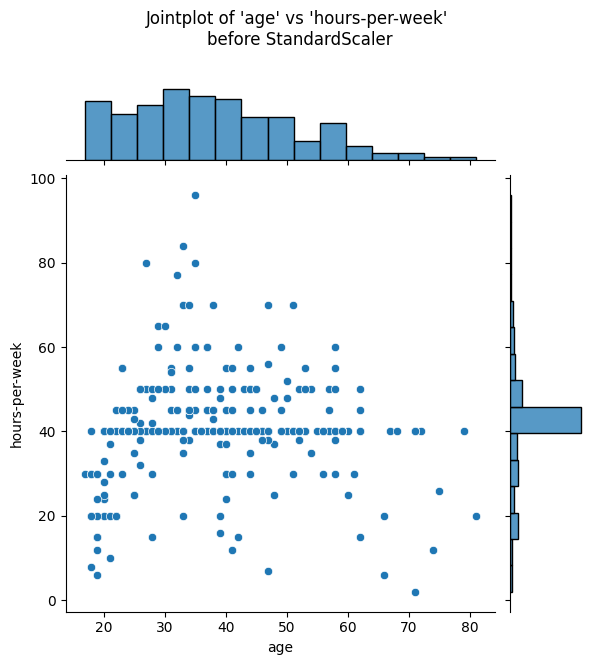

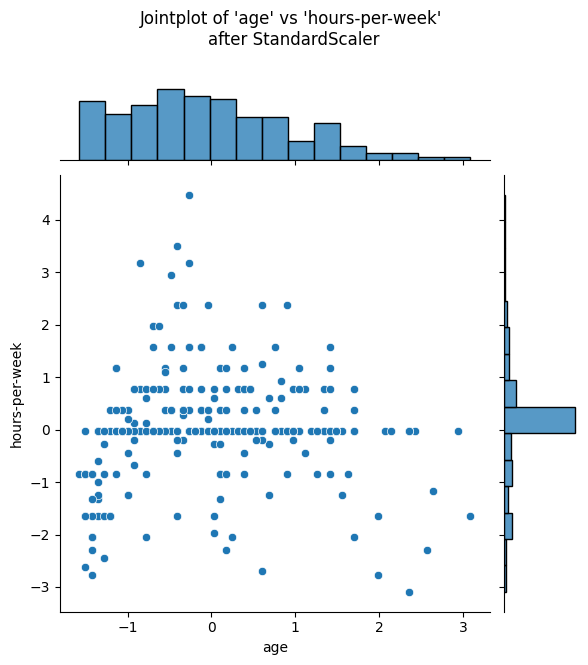

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# number of points to visualize to have a clearer plot
num_points_to_plot = 300

sns.jointplot(
    data=data_train[:num_points_to_plot],
    x="age",
    y="hours-per-week",
    marginal_kws=dict(bins=15),
)
plt.suptitle(
    "Jointplot of 'age' vs 'hours-per-week' \nbefore StandardScaler", y=1.1
)

sns.jointplot(
    data=data_train_scaled[:num_points_to_plot],
    x="age",
    y="hours-per-week",
    marginal_kws=dict(bins=15),
)
_ = plt.suptitle(
    "Jointplot of 'age' vs 'hours-per-week' \nafter StandardScaler", y=1.1
)

We can easily combine sequential operations with a scikit-learn `Pipeline`,
which chains together operations and is used as any other classifier or
regressor. The helper function `make_pipeline` creates a `Pipeline`: it
takes as arguments the successive transformations to perform, followed by the
classifier or regressor model.

In [ ]:
import time
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(), LogisticRegression())
model

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('logisticregression', LogisticRegression())])

The `make_pipeline` function did not require us to give a name to each step.
Indeed, it was automatically assigned based on the name of the classes
provided; a `StandardScaler` step is named `"standardscaler"` in the resulting
pipeline. We can check the name of each steps of our model:

In [ ]:
model.named_steps

{'standardscaler': StandardScaler(),
 'logisticregression': LogisticRegression()}

This predictive pipeline exposes the same methods as the final predictor:
`fit` and `predict` (and additionally `predict_proba`, `decision_function`, or
`score`).

In [ ]:
start = time.time()
model.fit(data_train, target_train)
elapsed_time = time.time() - start

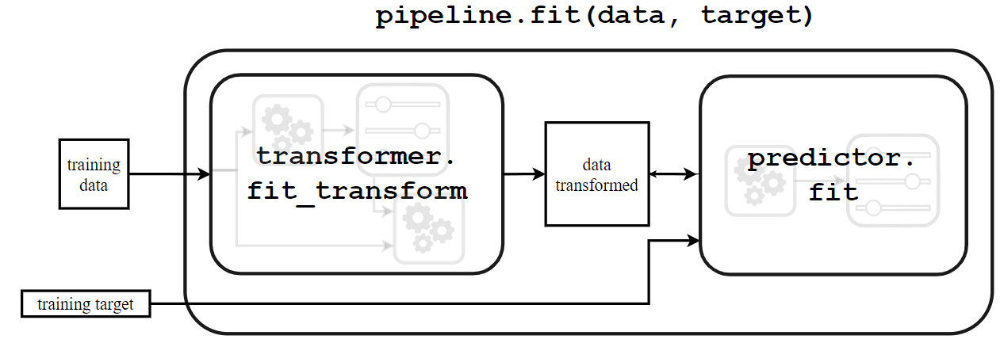

When calling `model.fit`, the method `fit_transform` from each underlying
transformer (here a single transformer) in the pipeline is called to:

- learn their internal model states
- transform the training data. Finally, the preprocessed data are provided to
  train the predictor.

To predict the targets given a test set, one uses the `predict` method.

In [ ]:
predicted_target = model.predict(data_test)
predicted_target[:5]

array([' <=50K', ' <=50K', ' >50K', ' <=50K', ' <=50K'], dtype=object)

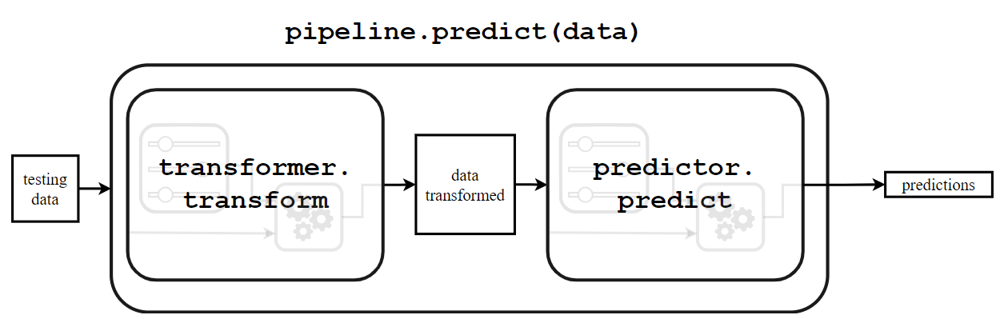

The method `transform` of each transformer (here a single transformer) is
called to preprocess the data. Note that there is no need to call the `fit`
method for these transformers because we are using the internal model states
computed when calling `model.fit`. The preprocessed data is then provided to
the predictor that outputs the predicted target by calling its method
`predict`.

As a shorthand, we can check the score of the full predictive pipeline calling
the method `model.score`. Thus, let's check the computational and
generalization performance of such a predictive pipeline.

In [ ]:
model_name = model.__class__.__name__
score = model.score(data_test, target_test)
print(
    f"The accuracy using a {model_name} is {score:.3f} "
    f"with a fitting time of {elapsed_time:.3f} seconds "
    f"in {model[-1].n_iter_[0]} iterations"
)

The accuracy using a Pipeline is 0.807 with a fitting time of 0.478 seconds in 12 iterations


We could compare this predictive model with the predictive model used in the
previous notebook which did not scale features.

In [ ]:
model = LogisticRegression()
start = time.time()
model.fit(data_train, target_train)
elapsed_time = time.time() - start

In [ ]:
model_name = model.__class__.__name__
score = model.score(data_test, target_test)
print(
    f"The accuracy using a {model_name} is {score:.3f} "
    f"with a fitting time of {elapsed_time:.3f} seconds "
    f"in {model.n_iter_[0]} iterations"
)

The accuracy using a LogisticRegression is 0.807 with a fitting time of 0.618 seconds in 59 iterations


We see that scaling the data before training the logistic regression was
beneficial in terms of computational performance. Indeed, the number of
iterations decreased as well as the training time. The generalization
performance did not change since both models converged.

# Model Evaluation using Cross Validation

In [ ]:
target_name = "class"
target = adult_census[target_name]
data = adult_census.drop(columns=target_name)

In [ ]:
numerical_columns = ["age", "capital-gain", "capital-loss", "hours-per-week"]

data_numeric = data[numerical_columns]

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(), LogisticRegression())

**The need for cross validation**

In the previous section, we split the original data into a training set and a
testing set. The score of a model in general depends on the way we make such a
split. One downside of doing a single split is that it does not give any
information about this variability. Another downside, in a setting where the
amount of data is small, is that the data available for training and testing
would be even smaller after splitting.

Instead, we can use cross-validation. Cross-validation consists of repeating
the procedure such that the training and testing sets are different each time.
Generalization performance metrics are collected for each repetition and then
aggregated. As a result we can assess the variability of our measure of the
model's generalization performance.

Note that there exists several cross-validation strategies, each of them
defines how to repeat the `fit`/`score` procedure. In this section, we use the
K-fold strategy: the entire dataset is split into `K` partitions. The
`fit`/`score` procedure is repeated `K` times where at each iteration `K - 1`
partitions are used to fit the model and `1` partition is used to score. The
figure below illustrates this K-fold strategy.


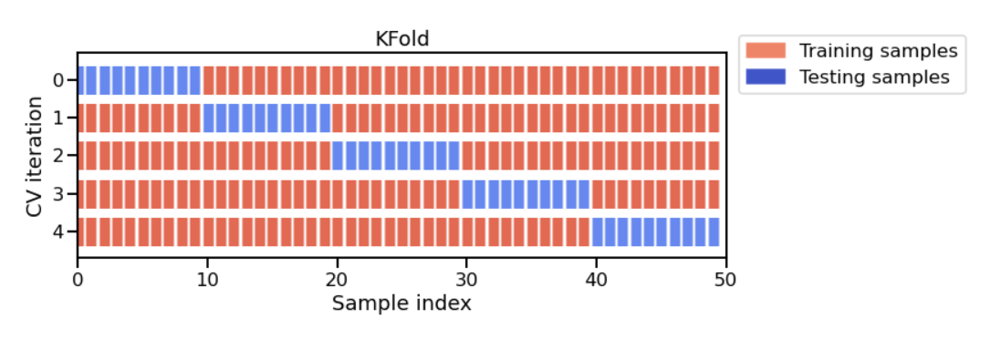

<div class="admonition note alert alert-info">
<p class="first admonition-title" style="font-weight: bold;">Note</p>
<p class="last">This figure shows the particular case of <strong>K-fold</strong> cross-validation strategy.
For each cross-validation split, the procedure trains a clone of model on all
the red samples and evaluate the score of the model on the blue samples. As
mentioned earlier, there is a variety of different cross-validation
strategies. Some of these aspects will be covered in more detail in future
notebooks.</p>
</div>

Cross-validation is therefore computationally intensive because it requires
training several models instead of one.

In scikit-learn, the function `cross_validate` allows to do cross-validation
and you need to pass it the model, the data, and the target. Since there
exists several cross-validation strategies, `cross_validate` takes a parameter
`cv` which defines the splitting strategy.

In [ ]:
%%time
from sklearn.model_selection import cross_validate

model = make_pipeline(StandardScaler(), LogisticRegression())
cv_result = cross_validate(model, data_numeric, target, cv=5)
cv_result

CPU times: user 1.11 s, sys: 449 ms, total: 1.56 s
Wall time: 1.53 s


{'fit_time': array([0.10248446, 0.30260682, 0.20281053, 0.24156666, 0.28294587]),
 'score_time': array([0.03930497, 0.08382201, 0.07197165, 0.07654333, 0.0413413 ]),
 'test_score': array([0.79557785, 0.80049135, 0.79965192, 0.79873055, 0.80436118])}

The output of `cross_validate` is a Python dictionary, which by default
contains three entries:
- (i) the time to train the model on the training data for each fold,
  `fit_time`
- (ii) the time to predict with the model on the testing data for each fold,
  `score_time`
- (iii) the default score on the testing data for each fold, `test_score`.

Setting `cv=5` created 5 distinct splits to get 5 variations for the training
and testing sets. Each training set is used to fit one model which is then
scored on the matching test set. The default strategy when setting `cv=int` is
the K-fold cross-validation where `K` corresponds to the (integer) number of
splits. Setting `cv=5` or `cv=10` is a common practice, as it is a good
trade-off between computation time and stability of the estimated variability.

Note that by default the `cross_validate` function discards the `K` models
that were trained on the different overlapping subset of the dataset. The goal
of cross-validation is not to train a model, but rather to estimate
approximately the generalization performance of a model that would have been
trained to the full training set, along with an estimate of the variability
(uncertainty on the generalization accuracy).

You can pass additional parameters to
[`sklearn.model_selection.cross_validate`](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_validate.html)
to collect additional information, such as the training scores of the models
obtained on each round or even return the models themselves instead of
discarding them. These features will be covered in a future notebook.

Let's extract the scores computed on the test fold of each cross-validation
round from the `cv_result` dictionary and compute the mean accuracy and the
variation of the accuracy across folds.

In [ ]:
scores = cv_result["test_score"]
print(
    "The mean cross-validation accuracy is: "
    f"{scores.mean():.3f} ± {scores.std():.3f}"
)

The mean cross-validation accuracy is: 0.800 ± 0.003


Note that by computing the standard-deviation of the cross-validation scores,
we can estimate the uncertainty of our model generalization performance. This
is the main advantage of cross-validation and can be crucial in practice, for
example when comparing different models to figure out whether one is better
than the other or whether our measures of the generalization performance of
each model are within the error bars of one-another.

In this particular case, only the first 2 decimals seem to be trustworthy. If
you go up in this notebook, you can check that the performance we get with
cross-validation is compatible with the one from a single train-test split.

# Encoding of categorical variables

In [ ]:
!ls

adult-census.csv  sample_data


In [ ]:
import pandas as pd
adult_census=pd.read_csv('adult-census.csv')
#adult_census.drop(columns='education-num',inplace=True) ( we have done it earlier)
target_name='class'
target=adult_census[target_name]
data=adult_census.drop(columns=target_name)

**Identify categorical variable**
 categorical variables have discrete values, typically
represented by string labels (but not only) taken from a finite list of
possible choices. For instance, the variable `native-country` in our dataset
is a categorical variable because it encodes the data using a finite list of
possible countries (along with the `?` symbol when this information is
missing):

In [ ]:
data["native-country"].value_counts().sort_index()

 ?                               857
 Cambodia                         28
 Canada                          182
 China                           122
 Columbia                         85
 Cuba                            138
 Dominican-Republic              103
 Ecuador                          45
 El-Salvador                     155
 England                         127
 France                           38
 Germany                         206
 Greece                           49
 Guatemala                        88
 Haiti                            75
 Holand-Netherlands                1
 Honduras                         20
 Hong                             30
 Hungary                          19
 India                           151
 Iran                             59
 Ireland                          37
 Italy                           105
 Jamaica                         106
 Japan                            92
 Laos                             23
 Mexico                          951
 

In [ ]:
data.dtypes

age                int64
workclass         object
education         object
marital-status    object
occupation        object
relationship      object
race              object
sex               object
capital-gain       int64
capital-loss       int64
hours-per-week     int64
native-country    object
dtype: object

If we look at the `"native-country"` column, we observe its data type is
`object`, meaning it contains string values.

**Select features based on their data type**

In the previous notebook, we manually defined the numerical columns. We could
do a similar approach. Instead, we can use the scikit-learn helper function
`make_column_selector`, which allows us to select columns based on their data
type. We now illustrate how to use this helper.

In [ ]:
from sklearn.compose import make_column_selector as selector

categorical_columns_selector = selector(dtype_include=object)
categorical_columns = categorical_columns_selector(data)
categorical_columns

['workclass',
 'education',
 'marital-status',
 'occupation',
 'relationship',
 'race',
 'sex',
 'native-country']

Here, we created the selector by passing the data type to include; we then
passed the input dataset to the selector object, which returned a list of
column names that have the requested data type. We can now filter out the
unwanted columns:

In [ ]:
data_categorical = data[categorical_columns]
data_categorical.head()

,workclass,education,marital-status,occupation,relationship,race,sex,native-country
0,Private,11th,Never-married,Machine-op-inspct,Own-child,Black,Male,United-States
1,Private,HS-grad,Married-civ-spouse,Farming-fishing,Husband,White,Male,United-States
2,Local-gov,Assoc-acdm,Married-civ-spouse,Protective-serv,Husband,White,Male,United-States
3,Private,Some-college,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,United-States
4,?,Some-college,Never-married,?,Own-child,White,Female,United-States


In [ ]:
print(f"The dataset is composed of {data_categorical.shape[1]} features")

The dataset is composed of 8 features


In the remainder of this section, we will present different strategies to
encode categorical data into numerical data which can be used by a
machine-learning algorithm.

**Encoding ordinal categories**

The most intuitive strategy is to encode each category with a different
number. The `OrdinalEncoder` transforms the data in such manner. We start by
encoding a single column to understand how the encoding works.

In [ ]:
from sklearn.preprocessing import OrdinalEncoder

education_column = data_categorical[["education"]]

encoder = OrdinalEncoder().set_output(transform="pandas")
education_encoded = encoder.fit_transform(education_column)
education_encoded

,education
0,1.0
1,11.0
2,7.0
3,15.0
4,15.0
...,...
48837,7.0
48838,11.0
48839,11.0
48840,11.0


We see that each category in `"education"` has been replaced by a numeric
value. We could check the mapping between the categories and the numerical
values by checking the fitted attribute `categories_`.

In [ ]:
encoder.categories_

[array([' 10th', ' 11th', ' 12th', ' 1st-4th', ' 5th-6th', ' 7th-8th',
        ' 9th', ' Assoc-acdm', ' Assoc-voc', ' Bachelors', ' Doctorate',
        ' HS-grad', ' Masters', ' Preschool', ' Prof-school',
        ' Some-college'], dtype=object)]

In [ ]:
data_encoded = encoder.fit_transform(data_categorical)
data_encoded[:5]

,workclass,education,marital-status,occupation,relationship,race,sex,native-country
0,4.0,1.0,4.0,7.0,3.0,2.0,1.0,39.0
1,4.0,11.0,2.0,5.0,0.0,4.0,1.0,39.0
2,2.0,7.0,2.0,11.0,0.0,4.0,1.0,39.0
3,4.0,15.0,2.0,7.0,0.0,2.0,1.0,39.0
4,0.0,15.0,4.0,0.0,3.0,4.0,0.0,39.0


In [ ]:
print(f"The dataset encoded contains {data_encoded.shape[1]} features")

The dataset encoded contains 8 features


We see that the categories have been encoded for each feature (column)
independently. We also note that the number of features before and after the
encoding is the same.

However, be careful when applying this encoding strategy:
using this integer representation leads downstream predictive models
to assume that the values are ordered (0 < 1 < 2 < 3... for instance).

By default, `OrdinalEncoder` uses a lexicographical strategy to map string
category labels to integers. This strategy is arbitrary and often
meaningless. For instance, suppose the dataset has a categorical variable
named `"size"` with categories such as "S", "M", "L", "XL". We would like the
integer representation to respect the meaning of the sizes by mapping them to
increasing integers such as `0, 1, 2, 3`.
However, the lexicographical strategy used by default would map the labels
"S", "M", "L", "XL" to 2, 1, 0, 3, by following the alphabetical order.

The `OrdinalEncoder` class accepts a `categories` constructor argument to
pass categories in the expected ordering explicitly. You can find more
information in the
[scikit-learn documentation](https://scikit-learn.org/stable/modules/preprocessing.html#encoding-categorical-features)
if needed.

If a categorical variable does not carry any meaningful order information
then this encoding might be misleading to downstream statistical models and
you might consider using one-hot encoding instead (see below).

**Encoding nominal categories (without assuming any order)**

`OneHotEncoder` is an alternative encoder that prevents the downstream
models to make a false assumption about the ordering of categories. For a
given feature, it creates as many new columns as there are possible
categories. For a given sample, the value of the column corresponding to the
category is set to `1` while all the columns of the other categories
are set to `0`.

In [ ]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(sparse_output=False).set_output(transform="pandas")
education_encoded = encoder.fit_transform(education_column)
education_encoded

,education_ 10th,education_ 11th,education_ 12th,education_ 1st-4th,education_ 5th-6th,education_ 7th-8th,education_ 9th,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Preschool,education_ Prof-school,education_ Some-college
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
48838,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
48839,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
48840,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


<div class="admonition note alert alert-info">
<p class="first admonition-title" style="font-weight: bold;">Note</p>
<p><tt class="docutils literal">sparse_output=False</tt> is used in the <tt class="docutils literal">OneHotEncoder</tt> for didactic purposes,
namely easier visualization of the data.</p>
<p class="last">Sparse matrices are efficient data structures when most of your matrix
elements are zero.

We see that encoding a single feature gives a dataframe full of zeros
and ones. Each category (unique value) became a column; the encoding
returned, for each sample, a 1 to specify which category it belongs to.

Let's apply this encoding on the full dataset.

In [ ]:
print(f"The dataset is composed of {data_categorical.shape[1]} features")
data_categorical.head()

The dataset is composed of 8 features


,workclass,education,marital-status,occupation,relationship,race,sex,native-country
0,Private,11th,Never-married,Machine-op-inspct,Own-child,Black,Male,United-States
1,Private,HS-grad,Married-civ-spouse,Farming-fishing,Husband,White,Male,United-States
2,Local-gov,Assoc-acdm,Married-civ-spouse,Protective-serv,Husband,White,Male,United-States
3,Private,Some-college,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,United-States
4,?,Some-college,Never-married,?,Own-child,White,Female,United-States


In [ ]:
data_encoded = encoder.fit_transform(data_categorical)
data_encoded[:5]

,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ 10th,...,native-country_ Portugal,native-country_ Puerto-Rico,native-country_ Scotland,native-country_ South,native-country_ Taiwan,native-country_ Thailand,native-country_ Trinadad&Tobago,native-country_ United-States,native-country_ Vietnam,native-country_ Yugoslavia
0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [ ]:
print(f"The encoded dataset contains {data_encoded.shape[1]} features")

The encoded dataset contains 102 features


Choosing an encoding strategy

Choosing an encoding strategy depends on the underlying models and the type of
categories (i.e. ordinal vs. nominal).

<div class="admonition note alert alert-info">
<p class="first admonition-title" style="font-weight: bold;">Note</p>
<p class="last">In general <tt class="docutils literal">OneHotEncoder</tt> is the encoding strategy used when the
downstream models are <strong>linear models</strong> while <tt class="docutils literal">OrdinalEncoder</tt> is often a
good strategy with <strong>tree-based models</strong>.</p>
</div>

Using an `OrdinalEncoder` outputs ordinal categories. This means
that there is an order in the resulting categories (e.g. `0 < 1 < 2`). The
impact of violating this ordering assumption is really dependent on the
downstream models. Linear models would be impacted by misordered categories
while tree-based models would not.

You can still use an `OrdinalEncoder` with linear models but you need to be
sure that:
- the original categories (before encoding) have an ordering;
- the encoded categories follow the same ordering than the original
  categories.
The **next exercise** highlights the issue of misusing `OrdinalEncoder` with
a linear model.

One-hot encoding categorical variables with high cardinality can cause
computational inefficiency in tree-based models. Because of this, it is not
recommended to use `OneHotEncoder` in such cases even if the original
categories do not have a given order. We will show this in the **final
exercise** of this sequence.

**Evaluate our predictive pipeline**

We can now integrate this encoder inside a machine learning pipeline like we
did with numerical data: let's train a linear classifier on the encoded data
and check the generalization performance of this machine learning pipeline using
cross-validation.

Before we create the pipeline, we have to linger on the `native-country`.
Let's recall some statistics regarding this column.

In [ ]:
data["native-country"].value_counts()

 United-States                 43832
 Mexico                          951
 ?                               857
 Philippines                     295
 Germany                         206
 Puerto-Rico                     184
 Canada                          182
 El-Salvador                     155
 India                           151
 Cuba                            138
 England                         127
 China                           122
 South                           115
 Jamaica                         106
 Italy                           105
 Dominican-Republic              103
 Japan                            92
 Guatemala                        88
 Poland                           87
 Vietnam                          86
 Columbia                         85
 Haiti                            75
 Portugal                         67
 Taiwan                           65
 Iran                             59
 Greece                           49
 Nicaragua                        49
 

We see that the `"Holand-Netherlands"` category is occurring rarely. This will
be a problem during cross-validation: if the sample ends up in the test set
during splitting then the classifier would not have seen the category during
training and would not be able to encode it.

In scikit-learn, there are some possible solutions to bypass this issue:

* list all the possible categories and provide them to the encoder via the
  keyword argument `categories` instead of letting the estimator automatically
  determine them from the training data when calling fit;
* set the parameter `handle_unknown="ignore"`, i.e. if an unknown category is
  encountered during transform, the resulting one-hot encoded columns for this
  feature will be all zeros;
* adjust the `min_frequency` parameter to collapse the rarest categories
  observed in the training data into a single one-hot encoded feature. If you
  enable this option, you can also set `handle_unknown="infrequent_if_exist"`
  to encode the unknown categories (categories only observed at predict time)
  as ones in that last column.

In this notebook we only explore the second option, namely
`OneHotEncoder(handle_unknown="ignore")`. Feel free to evaluate the
alternatives on your own, for instance using a sandbox notebook.

<div class="admonition tip alert alert-warning">
<p class="first admonition-title" style="font-weight: bold;">Tip</p>
<p class="last">Be aware the <tt class="docutils literal">OrdinalEncoder</tt> exposes a parameter also named <tt class="docutils literal">handle_unknown</tt>.
It can be set to <tt class="docutils literal">use_encoded_value</tt>. If that option is chosen, you can define
a fixed value that is assigned to all unknown categories during <tt class="docutils literal">transform</tt>.
For example, <tt class="docutils literal"><span class="pre">OrdinalEncoder(handle_unknown='use_encoded_value',</span> <span class="pre">unknown_value=-1)</span></tt> would set all values encountered during <tt class="docutils literal">transform</tt> to <tt class="docutils literal"><span class="pre">-1</span></tt>
which are not part of the data encountered during the <tt class="docutils literal">fit</tt> call. You are
going to use these parameters in the next exercise.</p>
</div>

In [ ]:
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LogisticRegression

model = make_pipeline(
    OneHotEncoder(handle_unknown="ignore"), LogisticRegression(max_iter=500)
)

<div class="admonition note alert alert-info">
<p class="first admonition-title" style="font-weight: bold;">Note</p>
<p class="last">Here, we need to increase the maximum number of iterations to obtain a fully
converged <tt class="docutils literal">LogisticRegression</tt> and silence a <tt class="docutils literal">ConvergenceWarning</tt>. Contrary
to the numerical features, the one-hot encoded categorical features are all
on the same scale (values are 0 or 1), so they would not benefit from
scaling. In this case, increasing <tt class="docutils literal">max_iter</tt> is the right thing to do.</p>
</div>

Finally, we can check the model's generalization performance only using the
categorical columns.

In [ ]:
from sklearn.model_selection import cross_validate

cv_results = cross_validate(model, data_categorical, target)
cv_results

{'fit_time': array([1.55318594, 1.54145432, 1.68688464, 1.47324657, 1.42435718]),
 'score_time': array([0.06494761, 0.06881046, 0.0711484 , 0.07854342, 0.07417583]),
 'test_score': array([0.83222438, 0.83560242, 0.82872645, 0.83312858, 0.83466421])}

In [ ]:
scores = cv_results["test_score"]
print(f"The accuracy is: {scores.mean():.3f} ± {scores.std():.3f}")

The accuracy is: 0.833 ± 0.002


As you can see, this representation of the categorical variables is
slightly more predictive of the revenue than the numerical variables
that we used previously.

# Exercise

The goal of this exercise is to evaluate the impact of using an arbitrary
integer encoding for categorical variables along with a linear classification
model such as Logistic Regression.

To do so, let's try to use `OrdinalEncoder` to preprocess the categorical
variables. This preprocessor is assembled in a pipeline with
`LogisticRegression`. The generalization performance of the pipeline can be
evaluated by cross-validation and then compared to the score obtained when
using `OneHotEncoder` or to some other baseline score.

First, we load the dataset.

In [2]:
import pandas as pd

adult_census = pd.read_csv("adult_census.csv")

In [3]:
target_name = "class"
target = adult_census[target_name]
data = adult_census.drop(columns=[target_name, "education-num"])

In [4]:
from sklearn.compose import make_column_selector as selector

categorical_columns_selector = selector(dtype_include=object)
categorical_columns = categorical_columns_selector(data)
data_categorical = data[categorical_columns]

Define a scikit-learn pipeline composed of an `OrdinalEncoder` and a
`LogisticRegression` classifier.

Because `OrdinalEncoder` can raise errors if it sees an unknown category at
prediction time, you can set the `handle_unknown="use_encoded_value"` and
`unknown_value` parameters. You can refer to the [scikit-learn
documentation](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OrdinalEncoder.html)
for more details regarding these parameters.

In [5]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OrdinalEncoder
from sklearn.linear_model import LogisticRegression

model=make_pipeline(
OrdinalEncoder(handle_unknown='use_encoded_value',unknown_value=-1),LogisticRegression(max_iter=500))

Your model is now defined. Evaluate it using a cross-validation using
`sklearn.model_selection.cross_validate`.

<div class="admonition note alert alert-info">
<p class="first admonition-title" style="font-weight: bold;">Note</p>
<p class="last">Be aware that if an error happened during the cross-validation,
<tt class="docutils literal">cross_validate</tt> would raise a warning and return NaN (Not a Number) as scores.
To make it raise a standard Python exception with a traceback, you can pass
the <tt class="docutils literal"><span class="pre">error_score="raise"</span></tt> argument in the call to <tt class="docutils literal">cross_validate</tt>. An
exception would be raised instead of a warning at the first encountered problem
and <tt class="docutils literal">cross_validate</tt> would stop right away instead of returning NaN values.
This is particularly handy when developing complex machine learning pipelines.</p>
</div>

In [6]:
from sklearn.model_selection import cross_validate

cv_results=cross_validate(model,data_categorical,target)
cv_results

{'fit_time': array([1.94094062, 1.3225534 , 1.07953143, 1.21029568, 1.07750368]),
 'score_time': array([0.22210193, 0.12083006, 0.1574173 , 0.14497852, 0.28726768]),
 'test_score': array([0.75514382, 0.75555328, 0.75573301, 0.75307125, 0.75788288])}

Now, we would like to compare the generalization performance of our previous
model with a new model where instead of using an `OrdinalEncoder`, we use a
`OneHotEncoder`. Repeat the model evaluation using cross-validation. Compare
the score of both models and conclude on the impact of choosing a specific
encoding strategy when using a linear model.

In [7]:
from sklearn.preprocessing import OneHotEncoder

model2=make_pipeline(
OneHotEncoder(handle_unknown='ignore'),LogisticRegression(max_iter=500))

In [8]:
cv_results2=cross_validate(model2,data_categorical,target)

In [9]:
print('Comparint-----\n')
scores_ordinal=cv_results['test_score']
scores_onehot=cv_results2['test_score']
print(f'For OrdinalEncoder = {scores_ordinal.mean()} +- {scores_ordinal.std()}')
print(f'For OneHotEncoder = {scores_onehot.mean()} +- {scores_onehot.std()}')

Comparint-----

For OrdinalEncoder = 0.7554768489536634 +- 0.001533509419209223
For OneHotEncoder = 0.8328692091154984 +- 0.002380669790744743


# Using numerical and categorical values together

In the previous section, we showed the required preprocessing to apply when
dealing with numerical and categorical variables. However, we decoupled the
process to treat each type individually. In this notebook, we show how to
combine these preprocessing steps.

We first load the entire adult census dataset.

In [10]:
adult_census = pd.read_csv("adult_census.csv")
# drop the duplicated column `"education-num"` as stated in the first notebook
adult_census = adult_census.drop(columns="education-num")

target_name = "class"
target = adult_census[target_name]

data = adult_census.drop(columns=[target_name])

**Selection based on data types**

We separate categorical and numerical variables using their data types to
identify them, as we saw previously that `object` corresponds to categorical
columns (strings). We make use of `make_column_selector` helper to select the
corresponding columns.

In [11]:
from sklearn.compose import make_column_selector as selector

numerical_columns_selector = selector(dtype_exclude=object)
categorical_columns_selector = selector(dtype_include=object)

numerical_columns = numerical_columns_selector(data)
categorical_columns = categorical_columns_selector(data)
print(numerical_columns)

['age', 'capital-gain', 'capital-loss', 'hours-per-week']


<div class="admonition caution alert alert-warning">
<p class="first admonition-title" style="font-weight: bold;">Caution!</p>
<p>Here, we know that <tt class="docutils literal">object</tt> data type is used to represent strings and thus
categorical features. Be aware that this is not always the case. Sometimes
<tt class="docutils literal">object</tt> data type could contain other types of information, such as dates that
were not properly formatted (strings) and yet relate to a quantity of
elapsed  time.</p>
<p class="last">In a more general scenario you should manually introspect the content of your
dataframe not to wrongly use <tt class="docutils literal">make_column_selector</tt>.</p>
</div>

`**Dispatch columns to a specific processor**`

In the previous sections, we saw that we need to treat data differently
depending on their nature (i.e. numerical or categorical).

Scikit-learn provides a `ColumnTransformer` class which sends specific
columns to a specific transformer, making it easy to fit a single predictive
model on a dataset that combines both kinds of variables together
(heterogeneously typed tabular data).

We first define the columns depending on their data type:

* **one-hot encoding** is applied to categorical columns. Besides, we use
  `handle_unknown="ignore"` to solve the potential issues due to rare
  categories.
* **numerical scaling** numerical features which will be standardized.

Now, we create our `ColumnTransfomer` by specifying three values: the
preprocessor name, the transformer, and the columns. First, let's create the
preprocessors for the numerical and categorical parts.

In [12]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler

categorical_preprocessor = OneHotEncoder(handle_unknown="ignore")
numerical_preprocessor = StandardScaler()

Now, we create the transformer and associate each of these preprocessors with
their respective columns.

In [13]:
from sklearn.compose import ColumnTransformer

preprocessor = ColumnTransformer(
    [
        ("one-hot-encoder", categorical_preprocessor, categorical_columns),
        ("standard_scaler", numerical_preprocessor, numerical_columns),
    ]
)

We can take a minute to represent graphically the structure of a
`ColumnTransformer`:

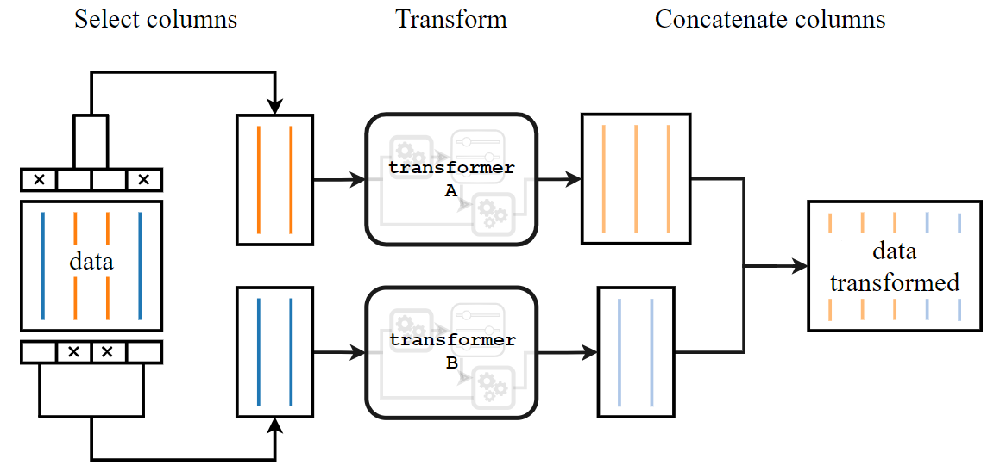

A `ColumnTransformer` does the following:

* It **splits the columns** of the original dataset based on the column names
  or indices provided. We obtain as many subsets as the number of transformers
  passed into the `ColumnTransformer`.
* It **transforms each subsets**. A specific transformer is applied to each
  subset: it internally calls `fit_transform` or `transform`. The output of
  this step is a set of transformed datasets.
* It then **concatenates the transformed datasets** into a single dataset.

The important thing is that `ColumnTransformer` is like any other scikit-learn
transformer. In particular it can be combined with a classifier in a
`Pipeline`:

In [14]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline

model = make_pipeline(preprocessor, LogisticRegression(max_iter=500))
model

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('one-hot-encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['workclass', 'education',
                                                   'marital-status',
                                                   'occupation', 'relationship',
                                                   'race', 'sex',
                                                   'native-country']),
                                                 ('standard_scaler',
                                                  StandardScaler(),
                                                  ['age', 'capital-gain',
                                                   'capital-loss',
                                                   'hours-per-week'])])),
                ('logisticregression', LogisticRegression(max_iter=500))])

The final model is more complex than the previous models but still follows the
same API (the same set of methods that can be called by the user):

- the `fit` method is called to preprocess the data and then train the
  classifier of the preprocessed data;
- the `predict` method makes predictions on new data;
- the `score` method is used to predict on the test data and compare the
  predictions to the expected test labels to compute the accuracy.

Let's start by splitting our data into train and test sets.

In [15]:
from sklearn.model_selection import train_test_split

data_train, data_test, target_train, target_test = train_test_split(
    data, target, random_state=42
)

<div class="admonition caution alert alert-warning">
<p class="first admonition-title" style="font-weight: bold;">Caution!</p>
<p class="last">Be aware that we use <tt class="docutils literal">train_test_split</tt> here for didactic purposes, to show
the scikit-learn API. In a real setting one might prefer to use
cross-validation to also be able to evaluate the uncertainty of our estimation
of the generalization performance of a model, as previously demonstrated.</p>
</div>

Now, we can train the model on the train set.

In [16]:
_ = model.fit(data_train, target_train)

Then, we can send the raw dataset straight to the pipeline. Indeed, we do not
need to make any manual preprocessing (calling the `transform` or
`fit_transform` methods) as it is already handled when calling the `predict`
method. As an example, we predict on the five first samples from the test set.

In [17]:
data_test.head()

,age,workclass,education,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country
7762,56,Private,HS-grad,Divorced,Other-service,Unmarried,White,Female,0,0,40,United-States
23881,25,Private,HS-grad,Married-civ-spouse,Transport-moving,Own-child,Other,Male,0,0,40,United-States
30507,43,Private,Bachelors,Divorced,Prof-specialty,Not-in-family,White,Female,14344,0,40,United-States
28911,32,Private,HS-grad,Married-civ-spouse,Transport-moving,Husband,White,Male,0,0,40,United-States
19484,39,Private,Bachelors,Married-civ-spouse,Sales,Wife,White,Female,0,0,30,United-States


In [18]:
model.predict(data_test)[:5]

array([' <=50K', ' <=50K', ' >50K', ' <=50K', ' >50K'], dtype=object)

In [19]:
target_test[:5]

7762      <=50K
23881     <=50K
30507      >50K
28911     <=50K
19484     <=50K
Name: class, dtype: object

To get directly the accuracy score, we need to call the `score` method. Let's
compute the accuracy score on the entire test set.

In [20]:
model.score(data_test, target_test)

0.8575874211776268

**Evaluation of the model with cross-validation**

As previously stated, a predictive model should be evaluated by
cross-validation. Our model is usable with the cross-validation tools of
scikit-learn as any other predictors:

In [21]:
from sklearn.model_selection import cross_validate

cv_results = cross_validate(model, data, target, cv=5)
cv_results

{'fit_time': array([1.60207772, 1.80226636, 1.12361908, 1.70007563, 1.7568419 ]),
 'score_time': array([0.07586622, 0.08836555, 0.04321194, 0.08809829, 0.08339667]),
 'test_score': array([0.8512642 , 0.8498311 , 0.84756347, 0.85247748, 0.85524161])}

In [22]:
scores = cv_results["test_score"]
print(
    "The mean cross-validation accuracy is: "
    f"{scores.mean():.3f} ± {scores.std():.3f}"
)

The mean cross-validation accuracy is: 0.851 ± 0.003


The compound model has a higher predictive accuracy than the two models that
used numerical and categorical variables in isolation.

**Fitting a more powerful model**

`Linear models` are nice because they are usually cheap to train, **small**
to deploy, `fast` to predict and give a `good baseline`.

However, it is often useful to check whether more complex models such as an
ensemble of decision trees can lead to higher predictive performance. In this
section we use such a model called `gradient-boosting trees` and evaluate
its generalization performance. More precisely, the scikit-learn model we use
is called `HistGradientBoostingClassifier`. Note that boosting models will be
covered in more detail in a future module.

For tree-based models, the handling of numerical and categorical variables is
simpler than for linear models:
* we do `not need to scale the numerical features`
* using an `ordinal encoding for the categorical variables` is fine even if
  the encoding results in an arbitrary ordering

Therefore, for `HistGradientBoostingClassifier`, the preprocessing pipeline is
slightly simpler than the one we saw earlier for the `LogisticRegression`:

In [24]:
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.preprocessing import OrdinalEncoder

categorical_preprocessor = OrdinalEncoder(
    handle_unknown="use_encoded_value", unknown_value=-1
)

preprocessor = ColumnTransformer(
    [("categorical", categorical_preprocessor, categorical_columns)],
    remainder="passthrough",
)

model = make_pipeline(preprocessor, HistGradientBoostingClassifier())

Now that we created our model, we can check its generalization performance.

In [25]:
%%time
_ = model.fit(data_train, target_train)

CPU times: user 9.29 s, sys: 3.04 ms, total: 9.3 s
Wall time: 12 s


In [26]:
model.score(data_test, target_test)

0.8803537793792482

We can observe that we get significantly higher accuracies with the Gradient
Boosting model. This is often what we observe whenever the dataset has a large
number of samples and limited number of informative features (e.g. less than
1000) with a mix of numerical and categorical variables.

This explains why Gradient Boosted Machines are very popular among datascience
practitioners who work with tabular data.

# Exercise

The goal of this exercise is to evaluate the impact of feature preprocessing
on a pipeline that uses a decision-tree-based classifier instead of a logistic
regression.

- The first question is to empirically evaluate whether scaling numerical
  features is helpful or not;
- The second question is to evaluate whether it is empirically better (both
  from a computational and a statistical perspective) to use integer coded or
  one-hot encoded categories.

In [27]:
import pandas as pd

adult_census = pd.read_csv("adult_census.csv")

In [28]:
target_name = "class"
target = adult_census[target_name]
data = adult_census.drop(columns=[target_name, "education-num"])

In [29]:
from sklearn.compose import make_column_selector as selector

numerical_columns_selector = selector(dtype_exclude=object)
categorical_columns_selector = selector(dtype_include=object)
numerical_columns = numerical_columns_selector(data)
categorical_columns = categorical_columns_selector(data)

**Reference pipeline (no numerical scaling and integer-coded categories)**

First let's time the pipeline we used in the main notebook to serve as a
reference:

In [30]:
import time

from sklearn.model_selection import cross_validate
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.ensemble import HistGradientBoostingClassifier

categorical_preprocessor = OrdinalEncoder(
    handle_unknown="use_encoded_value", unknown_value=-1
)
preprocessor = ColumnTransformer(
    [("categorical", categorical_preprocessor, categorical_columns)],
    remainder="passthrough",
)

model = make_pipeline(preprocessor, HistGradientBoostingClassifier())

start = time.time()
cv_results = cross_validate(model, data, target)
elapsed_time = time.time() - start

scores = cv_results["test_score"]

print(
    "The mean cross-validation accuracy is: "
    f"{scores.mean():.3f} ± {scores.std():.3f} "
    f"with a fitting time of {elapsed_time:.3f}"
)

The mean cross-validation accuracy is: 0.873 ± 0.003 with a fitting time of 13.755


**Scaling numerical features**

Let's write a similar pipeline that also scales the numerical features using
`StandardScaler` (or similar):

In [31]:
import time

from sklearn.model_selection import cross_validate
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.preprocessing import StandardScaler

categorical_preprocessor = OrdinalEncoder(
    handle_unknown="use_encoded_value", unknown_value=-1
)
numerical_preprocessor = StandardScaler()
preprocessor = ColumnTransformer(
    [("categorical", categorical_preprocessor, categorical_columns),
    ('numerical',numerical_preprocessor,numerical_columns)]
)

model = make_pipeline(preprocessor, HistGradientBoostingClassifier())

start = time.time()
cv_results = cross_validate(model, data, target)
elapsed_time = time.time() - start

scores = cv_results["test_score"]

print(
    "The mean cross-validation accuracy is: "
    f"{scores.mean():.3f} ± {scores.std():.3f} "
    f"with a fitting time of {elapsed_time:.3f}"
)

The mean cross-validation accuracy is: 0.873 ± 0.003 with a fitting time of 23.531


**One-hot encoding of categorical variables**

We observed that integer coding of categorical variables can be very
detrimental for linear models. However, it does not seem to be the case for
`HistGradientBoostingClassifier` models, as the cross-validation score of the
reference pipeline with `OrdinalEncoder` is reasonably good.

Let's see if we can get an even better accuracy with `OneHotEncoder`.

Hint: `HistGradientBoostingClassifier` does not yet support sparse input data.
You might want to use `OneHotEncoder(handle_unknown="ignore",
sparse_output=False)` to force the use of a dense representation as a
workaround.
`sparse input data`=( If the data stored for a particular feature contains mostly zeroes)

In [32]:
import time

from sklearn.model_selection import cross_validate
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import HistGradientBoostingClassifier

categorical_preprocessor = OneHotEncoder(
    handle_unknown="ignore",sparse_output=False
)
preprocessor = ColumnTransformer(
    [("categorical", categorical_preprocessor, categorical_columns)],
    remainder="passthrough",
)

model = make_pipeline(preprocessor, HistGradientBoostingClassifier())

start = time.time()
cv_results = cross_validate(model, data, target)
elapsed_time = time.time() - start

scores = cv_results["test_score"]

print(
    "The mean cross-validation accuracy is: "
    f"{scores.mean():.3f} ± {scores.std():.3f} "
    f"with a fitting time of {elapsed_time:.3f}"
)

The mean cross-validation accuracy is: 0.874 ± 0.002 with a fitting time of 27.758


# Visualizing scikit learn pipelines

We need to define our data and target. In this case we build a classification
model

In [33]:
import pandas as pd

ames_housing = pd.read_csv("ames_housing.csv", na_values="?")

target_name = "SalePrice"
data, target = (
    ames_housing.drop(columns=target_name),
    ames_housing[target_name],
)
target = (target > 200_000).astype(int) # astype to convert datatype into int here

In [34]:
data

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal


For the sake of simplicity, we can cherry-pick some features and only retain
this arbitrary subset of data:

In [35]:
numeric_features = ["LotArea", "FullBath", "HalfBath"]
categorical_features = ["Neighborhood", "HouseStyle"]
data = data[numeric_features + categorical_features]

**Then we create the pipeline**

The first step is to define the preprocessing steps</br></br>
class sklearn.impute.SimpleImputer(*, missing_values=nan, strategy='mean', fill_value=None, copy=True, add_indicator=False, keep_empty_features=False)[source]
Univariate imputer for completing missing values with simple strategies.

Replace missing values using a descriptive statistic (e.g. mean, median, or most frequent) along each column, or using a constant value.



In [36]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

numeric_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="median")),
        (
            "scaler",
            StandardScaler(),
        ),
    ]
)

categorical_transformer = OneHotEncoder(handle_unknown="ignore")

The next step is to apply the transformations using `ColumnTransformer`

In [37]:
from sklearn.compose import ColumnTransformer

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numeric_features),
        ("cat", categorical_transformer, categorical_features),
    ]
)

Then we define the model and join the steps in order

In [38]:
from sklearn.linear_model import LogisticRegression

model = Pipeline(
    steps=[
        ("preprocessor", preprocessor),
        ("classifier", LogisticRegression()),
    ]
)

Let's visualize it!

In [39]:
model

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['LotArea', 'FullBath',
                                                   'HalfBath']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['Neighborhood',
                                                   'HouseStyle'])])),
                ('classifier', LogisticRegression())])

**Finally we score the model**

In [40]:
from sklearn.model_selection import cross_validate

cv_results = cross_validate(model, data, target, cv=5)
scores = cv_results["test_score"]
print(
    "The mean cross-validation accuracy is: "
    f"{scores.mean():.3f} ± {scores.std():.3f}"
)

The mean cross-validation accuracy is: 0.859 ± 0.018


<div class="admonition note alert alert-info">
<p class="first admonition-title" style="font-weight: bold;">Note</p>
<p>In this case, around 86% of the times the pipeline correctly predicts whether
the price of a house is above or below the 200_000 dollars threshold. But be
aware that this score was obtained by picking some features by hand, which is
not necessarily the best thing we can do for this classification task. In this
example we can hope that fitting a complex machine learning pipelines on a
richer set of features can improve upon this performance level.</p>
<p class="last">Reducing a price estimation problem to a binary classification problem with a
single threshold at 200_000 dollars is probably too coarse to be useful in in
practice. Treating this problem as a regression problem is probably a better
idea.

# Extra resources

Further studies of this module can be found in,
1. [Column Transformer](https://scikit-learn.org/stable/auto_examples/compose/plot_column_transformer_mixed_types.html#sphx-glr-auto-examples-compose-plot-column-transformer-mixed-types-py)
2. [importance of feature scaling](https://scikit-learn.org/stable/auto_examples/preprocessing/plot_scaling_importance.html#sphx-glr-auto-examples-preprocessing-plot-scaling-importance-py)